In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Kladi Tutorial

This tutorial will cover the main steps of the analysis from my presentation:

0. Data loading and QC
1. scIPM modeling
2. Pseudotime inference
3. Module analysis
4. RP modeling
5. Driver TF Analaysis (covISD)

Right now, I'm calling it <i>Kladi</i> which means "branch" in Greek. I want to rename scIPM too but haven't come up with anything yet.

# 0. Data loading and QC

I've aready run QC and joined cells from the Share-seq dataset, but like we discussed, best data format is two anndata objects with expression and accessibility, and they must have identical cell axes by the time you create your joint representation

In [1]:
import scanpy as sc
import os
import numpy as np
import anndata
import glob
import logging
import seaborn as sns
sns.set(style = 'ticks')
import matplotlib.pyplot as plt
from IPython.display import Image
import logging
logging.basicConfig()
logger = logging.getLogger()
logger.setLevel(logging.INFO)

In [2]:
# The UMAP plot function kwargs I like
raw_umap = dict(color_map = 'Reds', outline_color = ('lightgrey','white'), outline_width = (1., 0.1), frameon = False, add_outline = True)
impute_umap = dict(color_map = 'viridis', layer = 'imputed', frameon = False)

In [3]:
atac_data = anndata.read_h5ad('data/shareseq/2021-02-01_atac_data.h5ad')

gex_data = anndata.read_h5ad('./data/shareseq/2021-05-05_just_raw_counts.h5ad')
gex_data.var.index = gex_data.var.index.str.upper()
gex_data=gex_data[:,~gex_data.var.index.duplicated()]

# 1a. scIPM expression modeling

First, we start by learning a latent represetnation of our data using scIPM, and we need to tune the hyperparameters. There are four major parameters that may be changed, from least to most important:

1. *dropout*: regularization parameter for encoder and decoder. Default of 0.2 appears to work well enough. If you experience "Node collapse", where multiple topics start to look the same or don't seem to describe a cohesive set of cells, increase this parameter.

2. *initial_counts*: related to the dirichlet prior, default of 10 leads to the discovery of really sharp, sparse latent representations. The genes that will be highly activated for these types of topics will be genes whose expression changes rapidly with the rise of new modules. These are usually the most interesting. Increasing to 20+ will lead to the discovery of more gradual trends.

3. *num_modules*: number of modules to extract from data. Should be carefully chosen. Too few and your imputations will not make sense and you'll miss interesting trends. Too many and eventually the model stops finding useful topics. It will still discover the major trends. Too many is probably better than too few.

**Expr model only:**

which genes to use for 1) latent variable features, 2) imputations.

When imputing data for later use in covISD and other downstream analysis, it's nice to know expression trends for genes that are not considered "highly variable", since basally-expressed TFs can still have intersting and cell-type specific effects. The first parameter of the expression model, "genes" should just be a list of all genes you want to impute, chosen by a tolerant mean_expression threshold.

The optional "highly_variable" parameter takes a boolean mask of the same length as your genelist. Genes marked with ``False`` will not be used as features for learning the latent variables for each cell. Excluding genes that are basally-expressed from the encoder features may help the model learn modules that are more fidelitous to the variability in the system rather than slow/basal trends.

Trying to set attribute `.var` of view, copying.


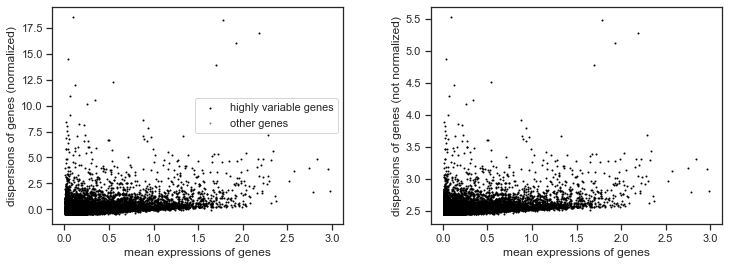

AnnData object with n_obs × n_vars = 34768 × 12180
    obs: 'n_genes'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'leiden', 'neighbors', 'pca', 'log1p', 'hvg'
    layers: 'counts'

In [109]:
sc.pp.filter_genes(gex_data, min_cells=15) #filter very lowly-expressed genes
gex_data.layers['counts'] = gex_data.X #save the raw data for scIPM.

sc.pp.normalize_total(gex_data, target_sum=1e4) #naive normalization
sc.pp.log1p(gex_data) 
sc.pp.highly_variable_genes(gex_data, min_disp=-0.5, n_bins=2,
                max_mean=3, subset=True) #set min_disp to -0.5 to catch all genes worth imputing
                                         #with subset=True, returns adata with nonvariable genes filtered out

sc.pl.highly_variable_genes(gex_data)

gex_data

Next, we can set a higher dispersion threshold for encoder features so we capture latent variable that track with dispersed genes, and to avoid training a high-dimensional encoder.

In [110]:
sc.pp.highly_variable_genes(gex_data) #use scanpy's defaults are good

gex_data.var.highly_variable.sum() #leaves use with 1800 genes to use as features, and 12000 genes to impute.
                                   #since the latent-variable to imputated expression relationship is linear, this
                                   #model won't have too many parameters

1813

In [5]:
# import the expression model
from kladi.matrix_models.expression_model import ExpressionModel

Next, we need to optimize the ``num_modules`` parameter. For this we use the ExpressionModels ``param_search`` function. This function takes args to specify a model, and an array of module nums to try in the ``num_modules`` argument.

It returns the test loss for each modeling condition. 
I may integrate this with the sklearn model selection construct in the future. 

**Use a GPU to train scIPM, otherwise it'll take forever.** If you're sucessfully using a GPU, the "Using CUDA" log output will be ``True``.

*Make sure that the "counts" matrix columns and the "genes" list are lined up correctly: 4th column is expression of 4th gene, etc.*

In [ ]:
counts = np.array(gex_data.layers['counts'].todense())# convert to dense matrix
test_modulenums = [6,10,16,24,30,36] 

test_loss = ExpressionModel.param_search(
        counts = counts, # count matrix (raw)
        genes = gex_data.var_names,  #names of genes/count columns, used for enrichment analysis
        num_modules= test_modulenums, #list of number of modules to try
        highly_variable=gex_data.var.highly_variable.values #mask over genes. Genes marked with True are used as encoder features
)

In [ ]:
sns.scatterplot(x = test_modulenums, y = test_loss)

Once we've found the best number of modules, we can train the "official" model of our expression data.

In [ ]:
expr_model = ExpressionModel(gex_data.var_names, 
                             highly_variable=gex_data.var.highly_variable.values, 
                             num_modules=24).fit(counts)

At this point, saving the model is probably a good idea.

In [ ]:
expr_model.save('expr_model.pth') #save

to reload the model, instantiate a scIPM object using the same parameters:
```
expr_model = ExpressionModel(gex_data.var_names, 
                             highly_variable=gex_data.var.highly_variable.values, 
                             num_modules=24)
expr_model.load('expr_model.pth')
```

After training the model, we can get our topics and imputations

In [21]:
gex_data.obsm['rna_topics'] = expr_model.predict(counts) #get latent vars
gex_data.layers['imputed'] = expr_model.impute(gex_data.obsm['rna_topics']) #use latent vars to impute

And we're done with expression modeling for now. Moving on to accessibility modeling.

# 1b. Accessibility Modeling

Training the accessibility model takes much much longer than the expression model, so it's best to use the same parameters optimized in the expression model.

Usually, we don't need to filter out any peaks from ATAC-seq peakcount matrices, since peaks are defined by having met a certain threshold of cells/fragments to be recognized in the first place. Filtering rare peaks makes it more difficult to learn modules for small populations.

The API is the same as the expression model, except that ``highly_available`` is not available, and instead of genes, we pass peaks (used for TF enrichment). The format for peaks is [[chr, start, end], ... ]:
```
[['chr9', 123461850, 123462150],
 ['chr1', 56782095, 56782395],
 ...
 ['chr16', 18533123, 18533423]]
```
They don't have to be sorted.

In [22]:
from kladi.matrix_models.accessibility_model import AccessibilityModel

atac_model = AccessibilityModel(atac_data.var[['chr','start','end']].values, num_modules=24)\
    .fit(atac_data.X) # pass raw peakcounts as sparse matrix

atac_model.save('atac_model.pth')

To load:
```
atac_model = AccessibilityModel(atac_data.var[['chr','start','end']].values.tolist(), num_modules=24)
atac_model.load('atac_model.pth')
```

We can get our atac latent variables, but we won't impute peaks since this will create a #cells x #peaks dense matrix which we really don't need in-memory for the analysis.

In [ ]:
atac_data.obsm['atac_topics'] = atac_data.predict(atac_data.X)

So that concludes the construction of our latent variable understanding of gene and peak modules in the data. Next step is to use these modules to make a joint low-dimensional representation of the data, then identify our intersting differentiation system.

# 2a. Joint representation + system identification

To make the joint cell representation, we paste together the ILR-transformed latent compositions from the expression and accessibility models. This will have a scanpy-style function in the future, but for now, manually use numpy and make sure your cell axes are aligned between the two views!

In [6]:
from kladi.matrix_models.ilr import ilr # the ILR (isometric logratio) transformation transforms compositional-space
                                        # latent variable to euclidean space

gex_data.obsm['joint_modules'] = np.hstack([ #hstack pastes the two matrices together. MAKE SURE CELLS ARE ALIGNED!!
    1.5 * ilr(gex_data.obsm['rna_topics']), #I scale the RNA representation by 1.5
    ilr(atac_data.obsm['atac_topics'])
])

Now we can make a UMAP view of the data and isolate a differentiation system to study.

I use 20 neighbors instead of the default of 30 to show more local structures.

In [7]:
sc.pp.neighbors(gex_data, use_rep='joint_modules', n_neighbors=20)

sc.tl.umap(gex_data, min_dist = 0.1)
sc.tl.leiden(gex_data, resolution=1.25)

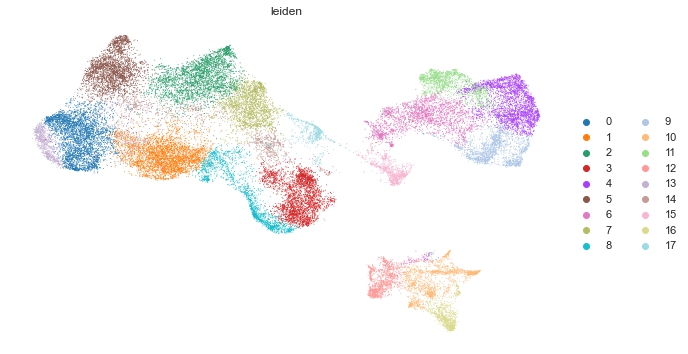

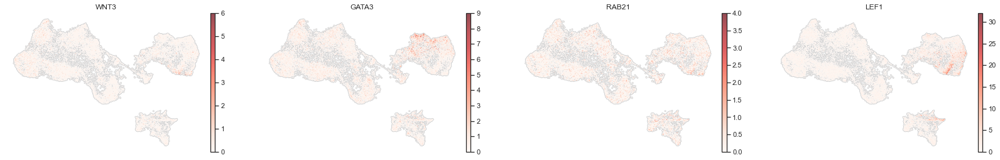

In [8]:
fig, ax =plt.subplots(1,1,figsize=(10,6))
sc.pl.umap(gex_data, color = 'leiden', frameon=False, ax=ax, color_map='tab20')

sc.pl.umap(gex_data, color = ['WNT3','GATA3','RAB21','LEF1'], **raw_umap)

Using the marker genes above, we can see that clusters 9, 4, and 11 contain the hair follicle differentiation system. Below, I use a previously-known set of cells to isolate our system-of-interest.

In [9]:
with open('data/shareseq/hf_cells.txt', 'r') as f:
    hf_cells = [x.strip() for x in f]

HF_expr = gex_data[hf_cells].copy()
HF_atac = atac_data[hf_cells].copy()

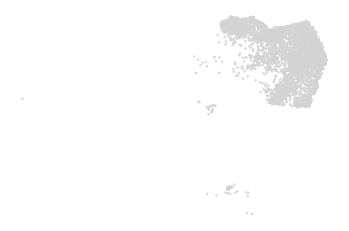

In [11]:
sc.pl.umap(HF_expr, frameon = False)

There we go! Hair follicle system isolated! Next, we do trajectory inference using Palantir.

# 2b. Pseudotime Trajectory Inference

In [12]:
from kladi.pseudotime.trajectory_inference import PalantirTrajectoryInference #import the inference object

To instate an inference object, you just need to pass the features that you want to define the diffusion map to ``cell features``, which in our case is the joint representation.

``n_neighbors`` is the number of nearest neighbors to computed various functions with. 30 works fine.

In [13]:
pti = PalantirTrajectoryInference(HF_expr.obsm['joint_modules'])

In [14]:
# first, compute diffusion representation of data
HF_expr.obsm['diffmap'] = pti.fit_diffusion_map()

Second, we want to make a UMAP representation of the data for plotting. The parameters of this function are just passed to UMAP, except ``continuity``, which is 1/``negative sampling rate``.

This parameter isn't talked about that much, but it directly controls how "continous" the data looks, and I've changed the default in this function to build a more continuous representation.

In [15]:
HF_expr.obsm['X_umap'] = pti.get_visual_representation()

Third, we need to choose start and terminal states in the system. To do that, I've added an interactive plotting function that allows you to pick and choose cells.
Below, I plot the UMAP representation, colored by WNT3 expression since I know that WNT3 is highly expressed at the ends of the Cortex and Medulla lineages. 

Setting ``projection = '3d'`` uses plotly to generate the UMAP instead of matplotlib. Hovering over cells shows their position and their cell# at the bottom of the box. That cell number is used in the next step to calculate pseudotime.

In [16]:
pti.plot_umap(projection='3d', hue = HF_expr[:,'WNT3'].layers['imputed'].reshape(-1))

The ``PalantirTrajectoryInference.get_pseudotime`` function below takes the cell# of the start cell as the first argument, followed by some options that will work in almost all situations. *The user must also specify terminal states*, which are passed as keyword arguments. The name of the argument is the name of that terminal state, and the value is the cell#.

In [17]:
HF_expr.obs['pseudotime'] = pti.get_pseudotime(5317, n_waypoints=3000, Medulla = 1242, Cortex = 1999, IRS = 3530)

<AxesSubplot:>

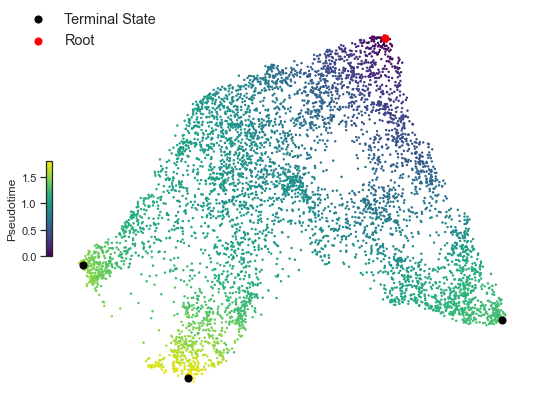

In [18]:
pti.plot_pseudotime()

Next, we can extract lineages from this data. The ``get_lineages`` function takes two parameters:

* shift: How late in the lineage to start pruning cells that are not likely to reach the end of the lineage
* stretch: How quickly that pruning function reaches its maximum stringency. 
    
If cells that appear unlikely to reach the end of a lineage are included in a lineage, try ajusting shift to early (0.7) and stretch to be more gradual (10). Usually, the default works fine.

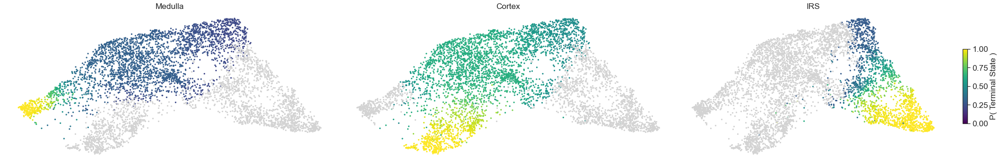

In [19]:
HF_expr.obs[['lineage_{}'.format(i) for i in ['1','2','3']]] = pti.get_lineages(shift=0.99, stretch = 100.)

pti.plot_lineages(height=5, size=5)

From the lineages above, we can then solved for the tree structure of the data. The ``get_cell_tree_states`` function takes one parameter, ``earliness_shift``, which allows you to change the locations of the branch sites. The default of 0 usually works best, but you can set it to values from -1 to 1, exclusive. Negative values will shift the branch locations to be later in pseudotime, while positive values with shift the branch to be earlier. 

The ``plot_states`` function colos the cells based on which terminal lineages they may still differentiate into. Changes in colors indicate the presence of a branch site at those cells. We can show how Kladi breaks down the lineage tree structure using the ``get_graphviz_tree`` function

<AxesSubplot:>

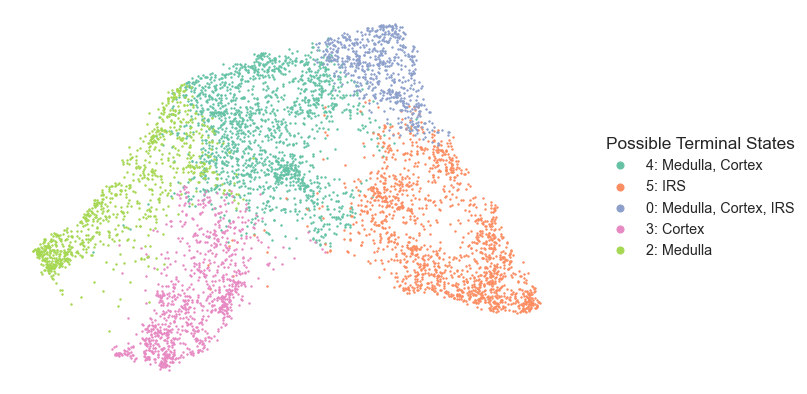

In [20]:
pti.get_cell_tree_states(earliness_shift=-0.33)
pti.plot_states(palette='Set2')

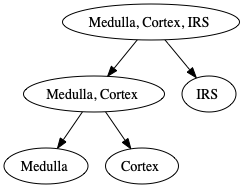

In [21]:
G=pti.get_graphviz_tree()
G.draw('data/shareseq/tree.png')
Image('data/shareseq/tree.png')

Following the steps above (start and terminal state selection --> pseudotime --> lineages --> branch sites), we can start to analyze pseudotemporal patterns. There are two main plotting functions: ``plot_swarm_tree`` and ``plot_feature_stream``. 

The former shows every cell in the sample arranged along a the tree structure of the data, and is useful for plotting discrete or qualitative data for each cell, such as read depth/QC statistics, cluster identities, or raw read counts.

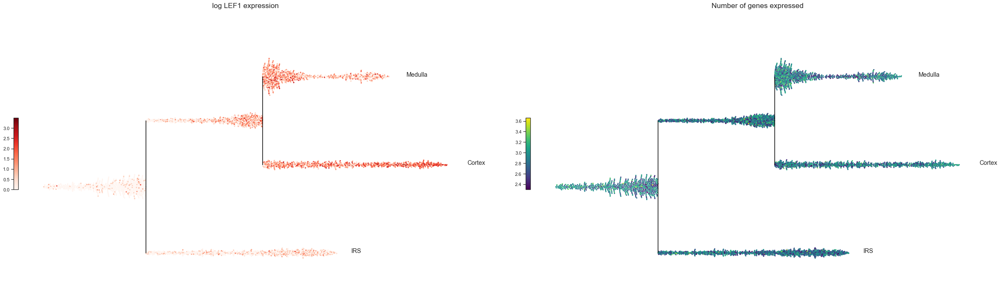

In [22]:
fig, ax = plt.subplots(1,2, figsize=(35,10))
pti.plot_swarm_tree(cell_colors=np.log1p(np.array(HF_expr[:, 'LEF1'].X.todense())), title = 'log LEF1 expression', show_legend=True, 
                    log_pseudotime=False, palette = 'Reds', ax = ax[0])
pti.plot_swarm_tree(cell_colors=np.log10(HF_expr.obs.n_genes.values), title='Number of genes expressed',show_legend=True, log_pseudotime=False, palette = 'viridis', ax =ax[1])
plt.tight_layout()

Meanwhile, ``plot_feature_stream`` is best for plotting continuous values over the course of the differentiation, like imuted gene expression, gene accessibility, etc. The ``features`` argument takes a (N x d) numpy array with a value for each cell (N) for each feature (d). Passing just one feature can be used to make easy-to-read streams for small multiples. The three genes below show three lineage-specific genes in this manner:

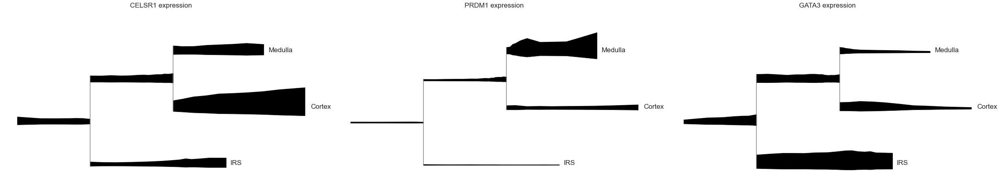

In [23]:
fig,ax = plt.subplots(1,3,figsize=(35,7))
for ax_i, gene in zip(ax, ['CELSR1','PRDM1','GATA3']):
    pti.plot_feature_stream(HF_expr[:, gene].layers['imputed'].reshape(-1), log_pseudotime=False, bin_size=100, ax = ax_i, clip = 3,
                           title=gene + ' expression')

But you can also overlay features for comparitive analysis to find antagonsistic and lineage-specific relationships:

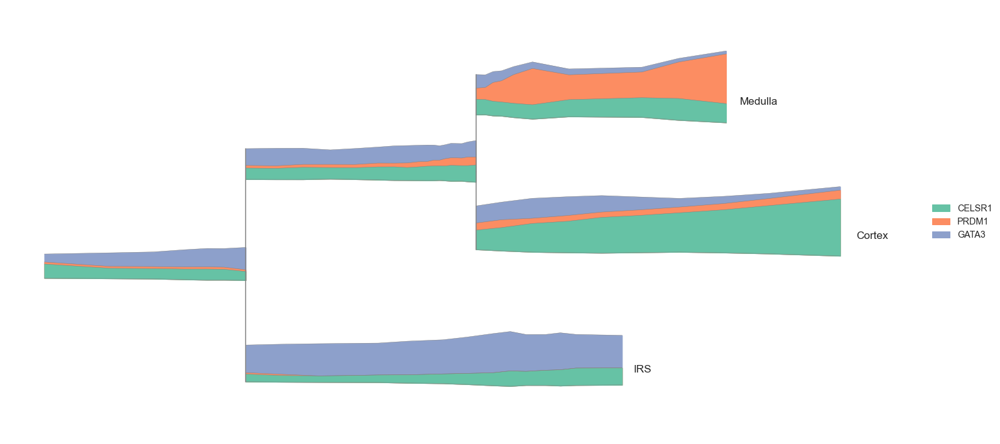

In [24]:
pti.plot_feature_stream(HF_expr[:, ['CELSR1','PRDM1','GATA3']].layers['imputed'], labels=['CELSR1','PRDM1','GATA3'], clip = 4, 
                        scale_features= True, max_bar_height=0.7, palette='Set2', log_pseudotime=False, bin_size=100, linewidth=0.5)
plt.show()

Important parameters for making attractive streamplots are:
* ``bin_size``: how many cells to average to get each datapoint. Higher binsize leads to smoother streams.
* ``log_pseudotime``: take the log of psuedotime as the x-axis. Useful for when branch points between lineages are concentrated early in pseudotime, as it reduces the length of very long branchs for more balanced plots
* ``max_bar_height``: changes the thickness of the streams
* ``labels``: text label for each feature to include in the legend
* ``title``: title to add to plot
* ``add_annotation``: show feature labels directly on streams, useful for when there are many features being plotted
* ``linewidth``: width of line dividing features, useful for when nearby streams have similar colors
* ``hide_feature_threshold``: When a feature composes less than this proportion of the stream height, it is not plotted. Produces a cleaner plot
* ``clip``: Adjusts the dynamic range of the plot by clipping feature values that are greater than "clip" standard deviations from the mean. If noise in the data has a greater magnitude than trends, decreasing clip will reduce the affect of noise in the plot.

Notably, ``plot_feature_stream`` can be used to plot module compositions of our cells during the differentiation process:

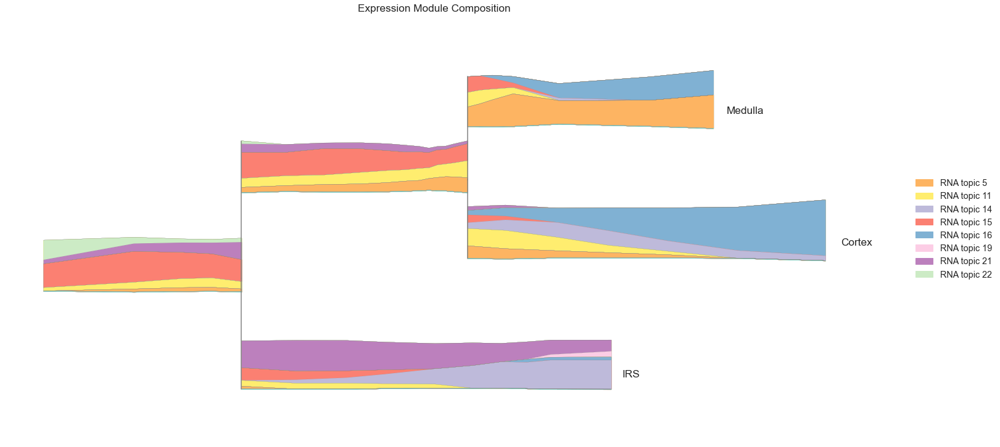

In [25]:
pti.plot_feature_stream(HF_expr.obsm['rna_topics'], hide_feature_threshold=0.04, max_bar_height=0.5, palette='Set3', log_pseudotime=False, bin_size=150,
                       linewidth=0.1, labels = ['RNA topic {}'.format(str(i)) for i in range(HF_expr.obsm['rna_topics'].shape[-1])], title = 'Expression Module Composition')
plt.show()

We can see that the branch between cortex and medulla cells are driven by the emergence of topic 14 in the Cortex, and topic 5 in the Medulla. Later, we see that topic 16 is more active in Cortex cells but is also present in the Medulla. The IRS lineage is dominated by topic 21 expression before topic 14 emergence. Let's see what enrichment analysis can say about the functional identity of each topic.

Using the ``expr_model`` object, we may query Enrichr using top genes from each module.

INFO:root:Querying Enrichr with module 14 genes.
INFO:root:Downloading results ...


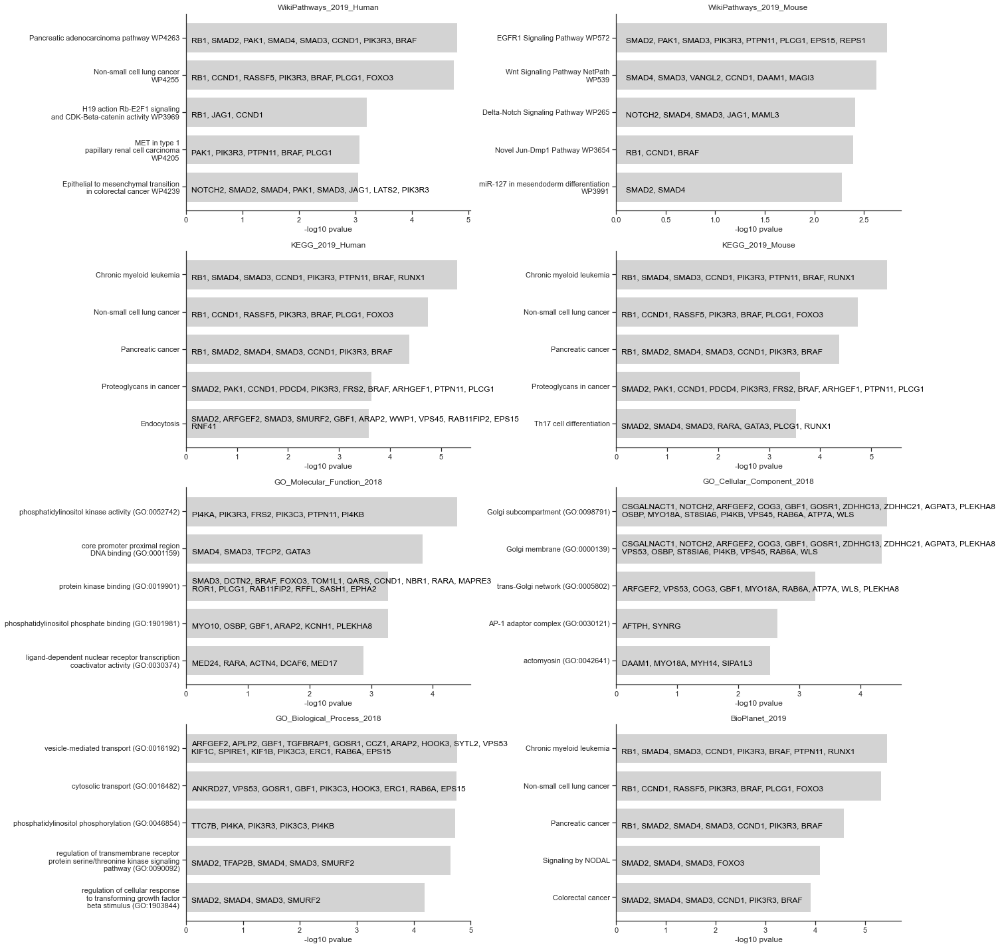

In [50]:
topic_14_key = expr_model.post_genelist(14, top_n_genes=250) #posts the genelist to Enrichr, returns query ID to fetch enrichments
enrichments = expr_model.get_enrichments(topic_14_key) #fetch enrichment results from API
expr_model.plot_enrichments(enrichments) #plot results

Great, we can see that topic 14, which is shared between late-stage IRS cells and drives the branch between Cortex and Medulla cells, is enriched for WNT and delta-Notch signaling!
If we want to see the expression of genes from a certain enrichment term, we can fetch gene names from the results of the ``get_enrichments`` method. We see below that the inferred expression patterns for delta-notch genes generally shows increased expression in both Cortex and Medulla lineages.

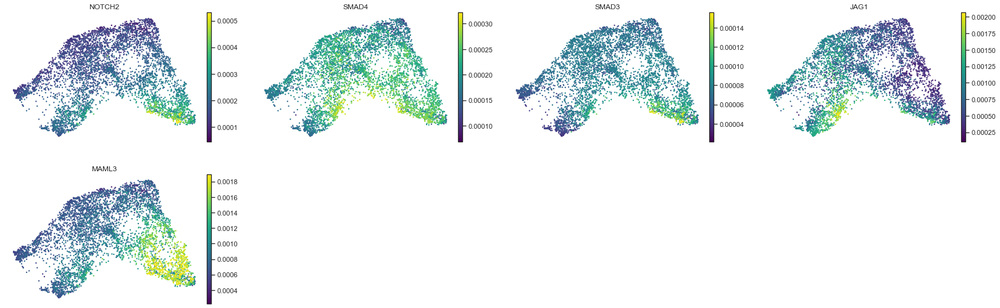

In [106]:
delta_notch_genes = enrichments['WikiPathways_2019_Mouse'][2]['genes'] #index by [ontology][rank][attribute]
sc.pl.umap(HF_expr, color=delta_notch_genes, layer='imputed',frameon=False,color_map='viridis')

So if Cortex and IRS expression is governed by Notch signaling, what controls Medulla expression? Using enrichment of Medulla-specific topic 5, we see that beta-catenin and TGF-beta signalling control Medulla expression identity.

INFO:root:Querying Enrichr with module 5 genes.
INFO:root:Downloading results ...


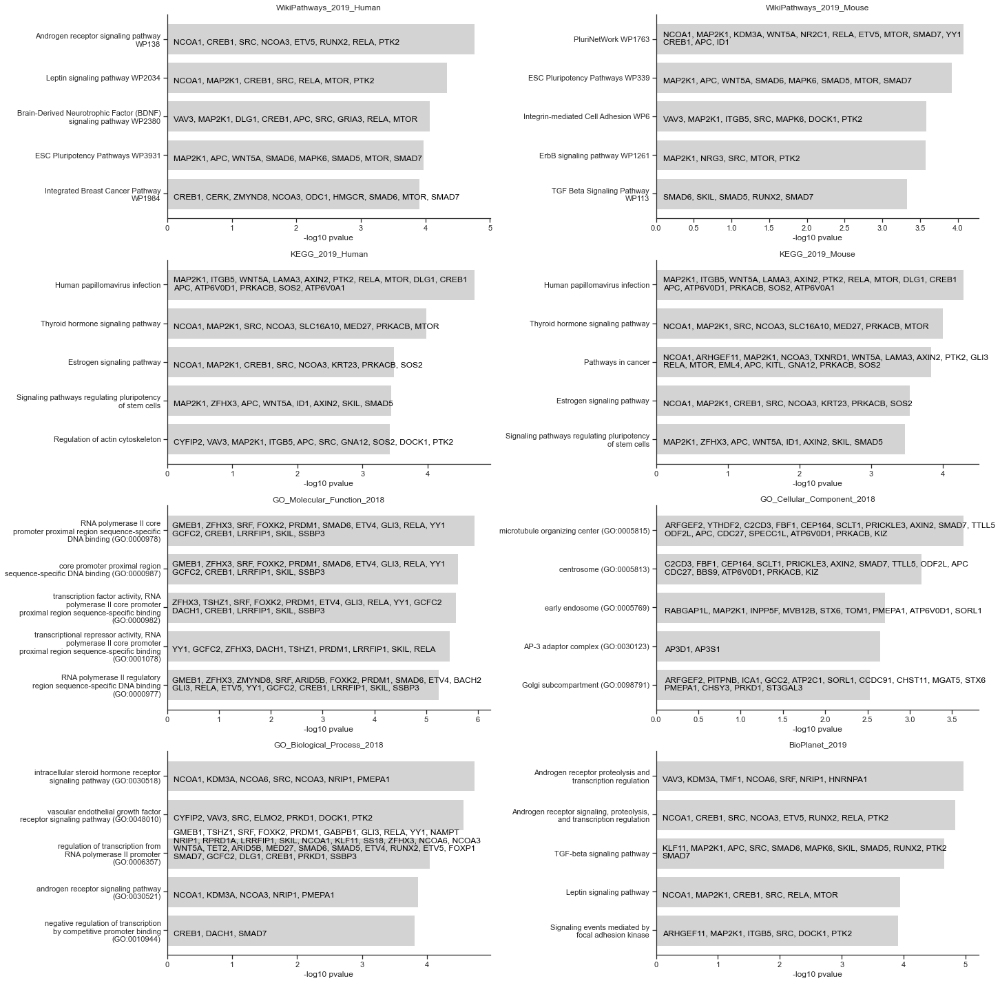

In [151]:
topic_5_key = expr_model.post_genelist(5, top_n_genes=250) #posts the genelist to Enrichr, returns query ID to fetch enrichments
enrichments = expr_model.get_enrichments(topic_5_key) #fetch enrichment results from API
expr_model.plot_enrichments(enrichments)

To further analyze our topics, we can see for a gene which topics activate its expression using ``ExpressionModel.rank_modules``. We can get the top genes from a topic for analysis with other tools using ``ExpressionModel.get_top_genes``.

In [51]:
for rank, (topic, activation) in zip(range(5,0,-1), expr_model.rank_modules('WNT3')[-5:]):
    print('Rank:', rank, 'topic:', topic, 'activation:', activation[0])

Rank: 5 topic: 5 activation: 0.24289846
Rank: 4 topic: 23 activation: 0.24411084
Rank: 3 topic: 3 activation: 0.24829563
Rank: 2 topic: 18 activation: 0.30379647
Rank: 1 topic: 16 activation: 0.44375834


In [31]:
topic_14_top_genes = expr_model.get_top_genes(14, top_n=250)
print(*topic_14_top_genes[-5:])

GPATCH1 SASH1 SLC39A8 PPFIBP1 SYNRG


Just as we can find gene-set enrichments for RNA topics, we can find TF-motif enrichments in accessibility topics. First, let's make a streamplot for accessibility topics to see which topics define cellular identities.

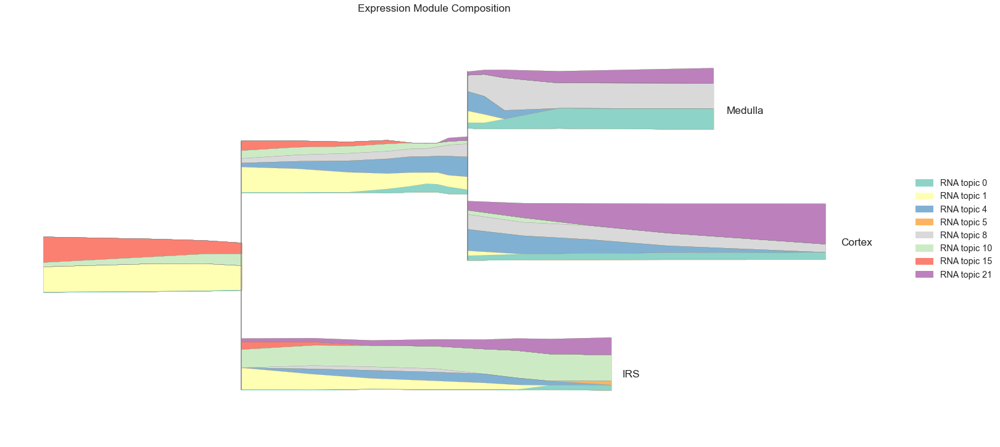

In [52]:
pti.plot_feature_stream(HF_atac.obsm['atac_topics'], hide_feature_threshold=0.05, max_bar_height=0.5, palette='Set3', log_pseudotime=False, bin_size=200,
                       linewidth=0.1, labels = ['RNA topic {}'.format(str(i)) for i in range(HF_atac.obsm['atac_topics'].shape[-1])], title = 'Expression Module Composition')
plt.show()

Now we'd like to know which TFs are influential with the rise of certain topics. Using the ``AccessibilityModel.get_motif_hits_in_peaks`` function, Kladi will scan the sequence of each peak for motif hits using MOODS. Kladi will automatically download up-to-date JASPAR position frequency matrices for all available factors.

In [152]:
atac_model.get_motif_hits_in_peaks('/Users/alynch/genomes/mm10/mm10.fa', p_value_threshold=0.00005)

INFO:root:Scanning peaks for motif hits with p >= 5e-05 ...
INFO:root:Building motif background models ...
INFO:root:Starting scan ...
INFO:root:Found 100000 motif hits ...
INFO:root:Found 200000 motif hits ...
INFO:root:Found 300000 motif hits ...
INFO:root:Found 400000 motif hits ...
INFO:root:Found 500000 motif hits ...
INFO:root:Found 600000 motif hits ...
INFO:root:Found 700000 motif hits ...
INFO:root:Found 800000 motif hits ...
INFO:root:Found 900000 motif hits ...
INFO:root:Found 1000000 motif hits ...
INFO:root:Found 1100000 motif hits ...
INFO:root:Found 1200000 motif hits ...
INFO:root:Found 1300000 motif hits ...
INFO:root:Found 1400000 motif hits ...
INFO:root:Found 1500000 motif hits ...
INFO:root:Found 1600000 motif hits ...
INFO:root:Found 1700000 motif hits ...
INFO:root:Found 1800000 motif hits ...
INFO:root:Found 1900000 motif hits ...
INFO:root:Found 2000000 motif hits ...
INFO:root:Found 2100000 motif hits ...
INFO:root:Found 2200000 motif hits ...
INFO:root:Found 

INFO:root:Found 20600000 motif hits ...
INFO:root:Found 20700000 motif hits ...
INFO:root:Found 20800000 motif hits ...
INFO:root:Found 20900000 motif hits ...
INFO:root:Found 21000000 motif hits ...
INFO:root:Found 21100000 motif hits ...
INFO:root:Found 21200000 motif hits ...
INFO:root:Found 21300000 motif hits ...
INFO:root:Found 21400000 motif hits ...
INFO:root:Found 21500000 motif hits ...
INFO:root:Found 21600000 motif hits ...
INFO:root:Found 21700000 motif hits ...
INFO:root:Found 21800000 motif hits ...
INFO:root:Found 21900000 motif hits ...
INFO:root:Found 22000000 motif hits ...
INFO:root:Found 22100000 motif hits ...
INFO:root:Found 22200000 motif hits ...
INFO:root:Found 22300000 motif hits ...
INFO:root:Found 22400000 motif hits ...
INFO:root:Found 22500000 motif hits ...
INFO:root:Found 22600000 motif hits ...
INFO:root:Found 22700000 motif hits ...
INFO:root:Found 22800000 motif hits ...
INFO:root:Found 22900000 motif hits ...
INFO:root:Found 23000000 motif hits ...


Motif scanning can take a while, so after this it's good to save the accessibility model again.

In [153]:
atac_model.save('data/shareseq/atac_model_with_motifs.pth')

In [26]:
atac_model.load('data/shareseq/atac_model_with_motifs.pth')

INFO:root:Moving model to device: cpu


An accessibility module/topic describes an activation for each peak under a certain condition. By finding which motifs are preferentially found in the most-activated peaks of a given module, we can see which factors are most influential in those conditions. The ``enrich_TFs`` function takes a module number and which quantile of peaks to consider as "activated". The default quantile of 0.2 finds motifs that are enriched in the top 20% of peaks relative to all others. Results are a table of [(motif_id, factor, pvalue, fisher-exact test statistic), ... ], sorted by pvalue.

In [31]:
atac_model.enrich_TFs(21)[:25]

INFO:root:Finding enrichment in top 66824 peaks ...
100%|██████████| 1413/1413 [00:08<00:00, 160.45it/s]


[('MA1622.1', 'Smad2::Smad3', 1.837814246423939e-275, 1.5755025324140683),
 ('MA1448.1', 'fos-1', 5.416446040066937e-273, 1.5305178706722455),
 ('MA0232.1', 'lbl', 9.422084567983761e-264, 1.5702950662339288),
 ('MA0478.1', 'FOSL2', 4.6881605984178925e-261, 1.592636412258238),
 ('MA1128.1', 'FOSL1::JUN', 9.156860856134203e-253, 1.5729715650621354),
 ('MA0477.2', 'FOSL1', 3.751929358100211e-248, 1.5760577267800437),
 ('MA0462.2', 'BATF::JUN', 7.546693472028286e-248, 1.5372727636441161),
 ('MA1634.1', 'BATF', 5.460927509505869e-246, 1.5388862213446546),
 ('MA1130.1', 'FOSL2::JUN', 2.2846298505669647e-244, 1.5828855228124035),
 ('MA0489.1', 'JUN(var.2)', 2.4552491808910345e-236, 1.542636020277138),
 ('MA0650.2', 'HOXA13', 7.787917275727569e-235, 1.9089929624084947),
 ('MA0835.2', 'BATF3', 8.867855658288957e-235, 1.5264559442926866),
 ('MA0099.3', 'FOS::JUN', 5.543939839791888e-234, 1.570774121686303),
 ('MA1137.1', 'FOSL1::JUNB', 1.538209928348459e-231, 1.5695905746076548),
 ('MA1134.1', '

Topic 21 is enriched for SMAD2/3, FOS-JUN, and HOX13 activity! Topic 10 is enriched for DLL, HOXA, MEOX, and VSX activity, among others. These later factors are related to NOTCH signaling.

In [32]:
atac_model.enrich_TFs(10)[:25]

INFO:root:Finding enrichment in top 66824 peaks ...
100%|██████████| 1413/1413 [00:09<00:00, 155.62it/s]


[('MA0187.1', 'Dll', 0.0, 2.6385892886209885),
 ('MA0224.1', 'exex', 0.0, 2.6385892886209885),
 ('MA0900.2', 'HOXA2', 0.0, 2.6289046605793898),
 ('MA1501.1', 'HOXB7', 0.0, 2.560022242554684),
 ('MA1481.1', 'DRGX', 0.0, 2.543173871587609),
 ('MA0132.2', 'PDX1', 0.0, 2.543173871587609),
 ('MA1497.1', 'HOXA6', 0.0, 2.5137167502415285),
 ('MA0723.1', 'VAX2', 0.0, 2.499505531713718),
 ('MA0661.1', 'MEOX1', 0.0, 2.4487351633560452),
 ('MA0725.1', 'VSX1', 0.0, 2.4017236447335204),
 ('MA0706.1', 'MEOX2', 0.0, 2.383284010707388),
 ('MA1519.1', 'LHX5', 0.0, 2.3319886041288655),
 ('MA0879.1', 'Dlx1', 0.0, 2.3270301933344943),
 ('MA0722.1', 'VAX1', 0.0, 2.319164421145899),
 ('MA0232.1', 'lbl', 0.0, 2.242042137274076),
 ('MA0184.1', 'CG9876', 0.0, 2.240462875146435),
 ('MA0198.1', 'OdsH', 0.0, 2.240462875146435),
 ('MA0202.1', 'Rx', 0.0, 2.240462875146435),
 ('MA0241.1', 'ro', 0.0, 2.240462875146435),
 ('MA0209.1', '', 0.0, 2.240462875146435),
 ('MA0200.1', 'Pph13', 0.0, 2.240462875146435),
 ('MA02

We can also give a motif score for each cell based on the probability of sampling a motif's binding site given that cell's latent composition. The ``get_motif_score`` function takes the latent compositions of cells and returns a normalized score for each motif. This value can be plotted on stream trees to show when accessibility of a TF's binding sites increased during differentiation.

In [33]:
motif_ids, scores = atac_model.get_motif_score(HF_atac.obsm['atac_topics'])

INFO:root:Finding posterior peak probabilities ...
100%|██████████| 23/23 [02:13<00:00,  5.81s/it]


In [34]:
HF_motifs = anndata.AnnData(X = scores, var = motif_ids)
HF_motifs.var.columns = ['id','factor']
HF_motifs.var = HF_motifs.var.set_index('factor')

HF_motifs.obsm['X_umap'] = pti.representation
HF_motifs.var_names_make_unique()

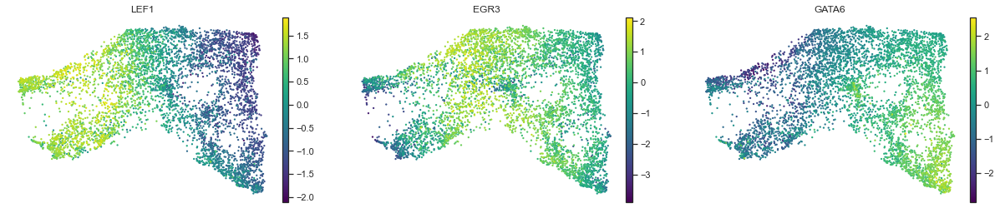

In [127]:
factors = ['LEF1','EGR3','GATA6']

sc.pl.umap(HF_motifs, color = factors, color_map='viridis', frameon=False)

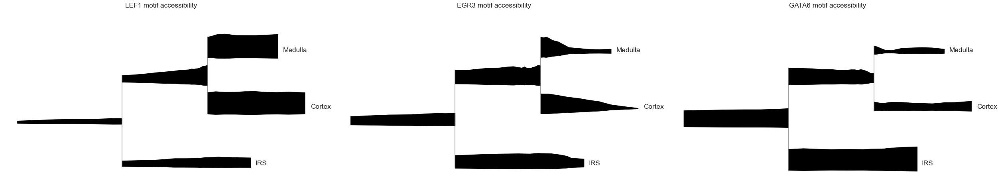

In [128]:
features = HF_motifs[:, factors].X
fig, ax = plt.subplots(1,len(factors),figsize=(35,7))
for x, factor, ax_i in zip(features.T, factors, ax):
    pti.plot_feature_stream(x, title = factor + ' motif accessibility', ax = ax_i, clip = 2, bin_size=100)

These accessibility topics contain more information than just TF modules, since they also encode patterns of accessibility around genes. We can compare accessibility around a gene to it's expression using RP models.

# 3. RP Modeling

RP modeling is used to connect our latent understanding of accessibility to expression through proximal peak activity around each gene. It takes ~2 seconds to train each RP model, so training 1000s of genes can take quite a while. Instead of training a model for each gene we imputed, we'll train RP models for genes whose expression shows interesting variance with respect to our expression topics. Eventually, we will seek to understand the transcription factors that regulate expression of our gene modules using these RP functions, so it is important that the most-activated genes for important modules are modeled.

Below, I simply take the top 250 genes from each topic that is highly activate in the hair follicle system.

In [27]:
rp_genes = list(set([gene for module in [5, 11, 14, 15, 16, 19, 21,22] for gene in expr_model.get_top_genes(module, top_n=250)]))

In [28]:
from kladi.rp_model import RPModeler #import RP modeler

The RP modeler takes the species, then the accessibility topic model and expression topic model, respectively. These two models work together to learn the best RP function connecting accessibility to gene epxression.

## 3a. Training

In [29]:
rp_modeler = RPModeler('mm10', atac_model, expr_model)

INFO:root:Loading gene info ...


To train RP models, one must provide the raw expression matrix used to train the expression topic model, as well as either to raw accessibility matrix used to train the accessibility topic model, <i>or</i> the accessibility latent compositions for each cell (this saves a little time on the setup computations.

Once instantiated, the RP Modeler object has two methods:

* ``train``, which trains RP models
* ``predict``, which predicts the expression of gene given a the accessibility state in a cell

Training RP models can take a while. If you don't have paired expression data or don't wish to train RP models, you can use ``get_naive_models`` to get base models for each gene, where upstream, downstream, and promoter peaks are weighted equally, and the influence of a peak on a gene decays by 1/2 every 15 kilobases.

```
rp_models = rp_modeler.train(rp_genes, gex_data.layers['counts'], accessibility_matrix=atac_data.X, iters = 200)
```

In [30]:
rp_models = rp_modeler.get_naive_models(rp_genes)
rp_genes = [model.name for model in rp_models] #some of the genes were filtered out if they were not found in mm10's RefSeq annotation, so get gene names again

## 3b. Predicted expression

Using the RP models, we can predict the expression of genes. Below, the top UMAPs show expression predictions using the RP models, while the bottom UMAPs show true expression.

In [47]:
rp_scores = anndata.AnnData(X = rp_modeler.predict(rp_models, accessibility_matrix = HF_atac.X), var = rp_genes)
rp_scores.var.columns = ['gene']
rp_scores.var = rp_scores.var.set_index('gene')

INFO:root:Binarizing accessibility matrix ...
INFO:root:Predicting latent variables ...
100%|██████████| 179/179 [00:15<00:00, 11.82it/s]
INFO:root:Finding posterior peak probabilities ...
100%|██████████| 23/23 [01:03<00:00,  2.78s/it]


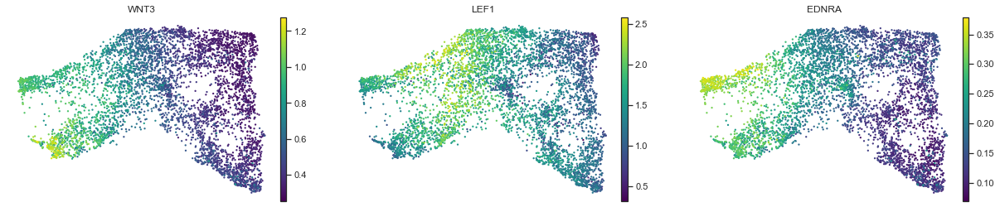

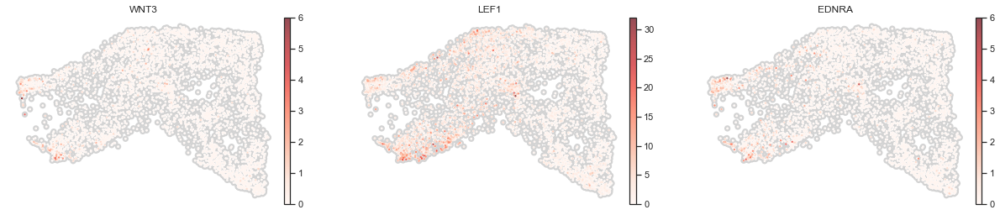

In [93]:
compare_genes = ['WNT3','LEF1','EDNRA']
sc.pl.umap(rp_scores, color = compare_genes, color_map='viridis', frameon=False)
sc.pl.umap(HF_expr, color = compare_genes, **raw_umap)

We can use these predictions to see how proximal accessibility relates to expression over pseudotime:

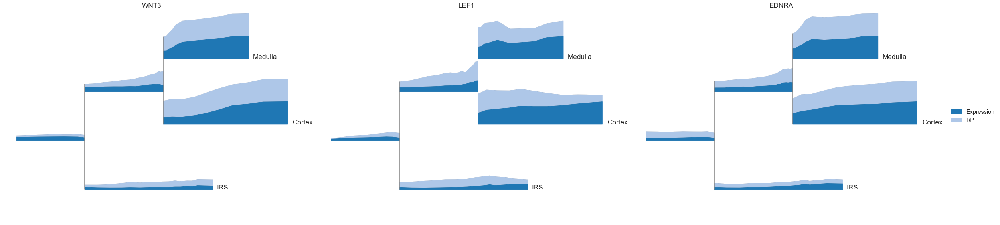

In [108]:
fig, ax = plt.subplots(1,len(compare_genes), figsize = (35,8))

loop = zip(ax, # loop over axes
    compare_genes, #gene names
    np.array(rp_scores[:,compare_genes].X).T, # get RP scores for gene
    np.array(HF_expr[:, compare_genes].layers['imputed']).T) # get expression for gene

for i, (ax_i, gene, rp_score, expr) in enumerate(loop):
    features = np.hstack([expr[:, np.newaxis], rp_score[:, np.newaxis]])
    pti.plot_feature_stream(features, clip = 1.5, palette='tab20', ax = ax_i, log_pseudotime = False, show_legend=i==2, title = gene, bin_size=100,
                            scale_features=True, center_baseline=False, max_bar_height=0.7, labels = ['Expression', 'RP'])
plt.tight_layout()
plt.show()

From the plots above, we can see WNT3 and LEF1 accessibility increases before expression, with the greatest difference being at the Cortex-Medulla branch, while for EDNRA they track more closely.

## 3c. Relating gene accessibility to topics

Another thing that we can do with these RP models is to find which genes' proximal accessibility is controlled by each accessibility topic using the ``AccessibilityModel.get_most_influenced_genes`` function. This function works similarly to the ``enrich_TFs`` function, where genes are ranked according to how many influential nearby peaks are activated by the topic.

In [110]:
atac_model.get_most_influenced_genes(rp_models, 21, top_n_genes=25)

INFO:root:Finding posterior peak probabilities ...
100%|██████████| 1/1 [00:00<00:00, 141.98it/s]
INFO:root:Calculating insilico-deletion scores ...
100%|██████████| 1644/1644 [00:00<00:00, 10981.22it/s]


('OSBP',
 'SHOC2',
 'MAP7',
 'SHB',
 'TOB1',
 'CDC14A',
 'SEC16A',
 'POLR2A',
 'B3GNTL1',
 'CERK',
 'ATP6V1D',
 'ACTN4',
 'SPPL3',
 'FOXO3',
 'PADI4',
 'MYH14',
 'PMEPA1',
 'NOTCH1',
 'ST14',
 'SMAD7',
 'HSPB8',
 'DSG4',
 'KRT35',
 'GTF2IRD1',
 'GJB2')

For accessibility topic 21, which is most influential in Cortex cells, we can see the genes whose proximal peaks are most controlled by the topic include NOTCH1, DSG4, and FOXO3, among others. This is very useful for determining which genes are seeing focused regulation in terms of accessibility changes at each stage in the differentiation.

Finally, the third major function of RP models is to measure potential TF influence on genes using covariance ISD.

# 4. Covariance Insilico-Deletion (CovISD)

Measures which transcription factors drive sets of genes based on how expression appears to change with respect to that TF's occupancy in the proximal chromatin. To instantiate a ``CovISD`` object, you must pass an ``AccessibilityModel``, ``ExpressionModel``, *and* a ``PalantirTrajectoryInference`` model.

In [31]:
from kladi.covISD import CovISD

In [32]:
covisd = CovISD(accessibility_model=atac_model, expression_model=expr_model, pseudotime_model=pti)

The ``predict`` function takes a list of gene RP models as ``gene_models``, either expression latent compositions or a raw expression matrix (and the covISD object will calculate the latent compositions itself), and either accessibility latent compositions or raw accessibility / peak-count matrix.

In [33]:
covisd.predict(gene_models=rp_models, expression_latent_compositions=HF_expr.obsm['rna_topics'], 
               accessibility_latent_compositions=HF_atac.obsm['atac_topics'], bin_size=200)

INFO:root:Summarized trajectory with 31 state changes.
INFO:root:Matched 330 factors with expression data.
INFO:root:Matched 1644 RP models with expression data.
INFO:root:Finding posterior peak probabilities ...
100%|██████████| 1/1 [00:00<00:00, 13.26it/s]
INFO:root:Calculating insilico-deletion scores ...
100%|██████████| 50964/50964 [01:57<00:00, 435.47it/s]
INFO:root:Removing 0 factors.


Using the covISD object, we can investigate driver TF-gene relationsips. For instance, if we wanted to know the predicted drivers of WNT3 expression, we can use ``CovISD.rank_factor_influence``. We see below that the top factors are RORC, TCF7, LEF1, and FOS/JUN, which are all factors that mediate the $\beta$-catenin signaling pathway and appear to participate in positive feedback by expressing the WNT3 ligand.

In [34]:
print(*covisd.rank_factor_influence('WNT3')[:10], sep = '\t')

RORC	TCF7	LEF1	FOSL2::JUNB	NR1D2	NRG1	HOXB7	ZBTB7C	JUNB	FOSL2::JUND


Gene-by-gene analysis is fine, but its more interesting to know which factors or signals are coordinating to cause major functional expression and identity changes during differentiation. Since the assumption behind gene modules is that covarying expression of genes implies shared regulation, we can use genesets derived from our expression modules to identify the driver TFs of major expression events. 

Using the ``ExpressionModel.get_top_genes`` function to extract a genelist, we pop that list into the ``CovISD.get_driver_TFs`` function to rank each factor based on how specifically it iteracts with the input genes vs the background (all other genes). This answers the question of "which TFs are mediating the expression of topic 5 genes?".

The resulting list is in the format [(factor name, pvalue, test-statistic), ...], sorted by pvalue. We can see that FOS/JUN, LEF1, TCF7, ETV4, and BACH2 drive the expression of these genes. Since topic 5 is highly activated in Medulla cells, we know these factors are influential to atleast one component of Medulla expression.

In [47]:
covisd.get_driver_TFs(
    expr_model.get_top_genes(5, top_n=200)
)[:20]

INFO:root:Matched 194 query genes with modeled genes.


[('FOSL1::JUNB', 1.3783274667763466e-27, 206366.5),
 ('TCF7', 1.1279883357823803e-25, 204053.0),
 ('FOSL1::JUN', 4.201584551517058e-25, 203319.0),
 ('LEF1', 3.0901985167370892e-24, 202212.0),
 ('FOSL2::JUNB', 6.49212027138127e-22, 199654.0),
 ('FOSL1', 1.769392808044539e-21, 198134.0),
 ('FOSL2', 8.598177105386173e-21, 197972.0),
 ('JUNB', 3.571486604405835e-20, 194560.5),
 ('FOSL2::JUND', 4.16418913101578e-20, 196945.5),
 ('FOSL2::JUN', 8.886566213316738e-19, 194841.5),
 ('RUNX1', 1.1703280115842434e-17, 192006.0),
 ('BACH2', 5.827340707419614e-17, 187218.5),
 ('RORA', 5.16335824777664e-16, 186991.0),
 ('ETV4', 6.512002954818689e-16, 186940.0),
 ('MAFF', 8.821907267290891e-16, 185138.5),
 ('MAFG', 1.6405939411609291e-15, 187942.5),
 ('PBX1', 6.308864123356356e-15, 186309.0),
 ('MEF2D', 8.779827385273175e-14, 183174.0),
 ('HOXB9', 9.854382212970385e-14, 185013.0),
 ('SREBF2', 7.461468506636667e-13, 180820.5)]

Often, it is useful to compare the driver TFs between modules to find specific regulators for each, as well as shared influential factors. This may be facilated with the ``CovISD.plot_compare_genelists`` function, and the ``CovISD.plot_compare_gene_modules`` function.

``plot_compare_genelists`` takes as arguments two genesets, then displays a contrastive plot like below. The user may also pass a ``hue`` for each transcription factor (factor names can be found with the ``.factor_names`` attribute). Modules themselves are already interesting genesets, so a shortcut for comparitive analysis of TF drivers between two modules is the ``plot_compare_gene_modules``. The user may pass the number of two modules, and the factors will be colored by their relative expression given those modules. Often, the most influential factors for a module are also more highly expressed.

For attractive plots, one may tune the ``pval_threshold`` parameter, which controls the threshold at which TFs are labeled, and the ``label_closeness`` parameter. Higher values move the label closer to the datapoint, while lower values enforce larger distances between labels. This may be better for readability of densely-labeled plots.

INFO:root:Matched 194 query genes with modeled genes.
INFO:root:Matched 190 query genes with modeled genes.


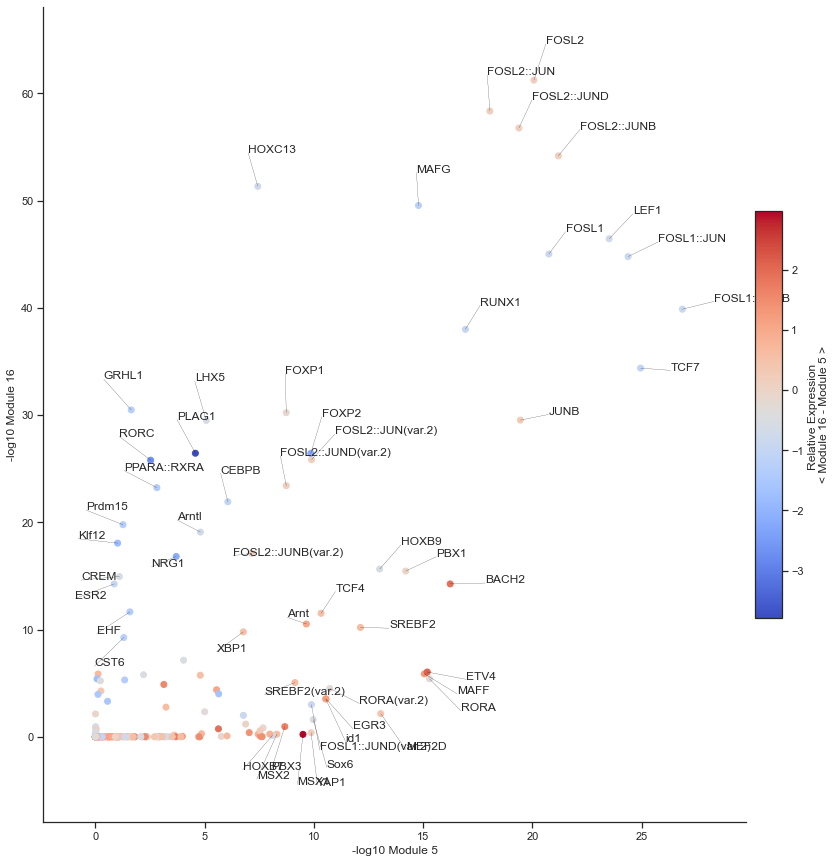

In [75]:
covisd.plot_compare_gene_modules(5, 16, figsize=(15,15), label_closeness=5, pval_threshold = (1e-8, 1e-8))

From the plot above, we can see that EGR3, ID1, ETV, and BACH2 are specific for module 5 genes (among others), while HOXC13, LHX5, and PLAG1 are specific for module 16 genes. FOS, LEF1, and RUNX1 are influential to the expression of both genesets.